In [241]:
from tensorflow import keras
import pandas as pd
from sklearn.preprocessing import StandardScaler

import plotly.graph_objects as go
import numpy as np
import tensorflow as tf

np.random.seed(1)
tf.random.set_seed(1)

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, RepeatVector, TimeDistributed

print('Tensorflow version: ', tf.__version__)

Tensorflow version:  2.8.0


In [242]:
import hana_ml

In [243]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA

In [244]:
pip install plotly==5.5.0

Note: you may need to restart the kernel to use updated packages.


In [272]:
df = pd.read_csv('weather.csv')
df['Timestamp'] = pd.to_datetime(df['Timestamp'])
df = df.sort_values(by='Timestamp',ascending=True)

In [273]:
df.head()

,Timestamp,Min_Windspeed1,Max_Windspeed1,Avg_Windspeed1,Var_Windspeed1,Min_Windspeed2,Max_Windspeed2,Avg_Windspeed2,Var_Windspeed2,Min_Winddirection2,...,Anemometer2_CorrOffset,DistanceAirPress,AirRessureSensorZeroOffset,Anemometer1_Avg_Freq,Anemometer2_Avg_Freq,Pressure_Avg_Freq,Year,Month,Day,Hour
0,2016-01-01 00:00:00+00:00,3.7,6.0,5.1,0.21,3.8,6.0,5.1,0.22,236,...,0,0,600,98,99,418,2016,1,1,0
1,2016-01-01 00:10:00+00:00,4.1,6.0,5.1,0.09,4.1,6.0,5.2,0.10,236,...,0,0,600,99,101,418,2016,1,1,0
2,2016-01-01 00:20:00+00:00,4.5,6.7,5.7,0.26,4.4,6.8,5.8,0.30,236,...,0,0,600,111,113,418,2016,1,1,0
3,2016-01-01 00:30:00+00:00,5.1,7.0,6.3,0.11,5.1,7.1,6.4,0.12,236,...,0,0,600,122,125,418,2016,1,1,0
4,2016-01-01 00:40:00+00:00,4.7,7.3,6.2,0.27,4.9,7.4,6.3,0.27,236,...,0,0,600,121,123,417,2016,1,1,0


In [274]:
df.dtypes

Timestamp                     datetime64[ns, UTC]
Min_Windspeed1                            float64
Max_Windspeed1                            float64
Avg_Windspeed1                            float64
Var_Windspeed1                            float64
Min_Windspeed2                            float64
Max_Windspeed2                            float64
Avg_Windspeed2                            float64
Var_Windspeed2                            float64
Min_Winddirection2                          int64
Max_Winddirection2                          int64
Avg_Winddirection2                          int64
Var_Winddirection2                          int64
Min_AmbientTemp                             int64
Max_AmbientTemp                             int64
Avg_AmbientTemp                             int64
Min_Pressure                                int64
Max_Pressure                                int64
Avg_Pressure                                int64
Min_Humidity                              float64


In [275]:
df['Timestamp'] = pd.to_datetime(df['Timestamp'])

In [276]:
df.dtypes

Timestamp                     datetime64[ns, UTC]
Min_Windspeed1                            float64
Max_Windspeed1                            float64
Avg_Windspeed1                            float64
Var_Windspeed1                            float64
Min_Windspeed2                            float64
Max_Windspeed2                            float64
Avg_Windspeed2                            float64
Var_Windspeed2                            float64
Min_Winddirection2                          int64
Max_Winddirection2                          int64
Avg_Winddirection2                          int64
Var_Winddirection2                          int64
Min_AmbientTemp                             int64
Max_AmbientTemp                             int64
Avg_AmbientTemp                             int64
Min_Pressure                                int64
Max_Pressure                                int64
Avg_Pressure                                int64
Min_Humidity                              float64


In [277]:
df = df[['Timestamp','Min_Windspeed1']]

In [278]:
# scaled = df.drop(columns = ['Timestamp'])

In [279]:
# scaled

In [280]:
df['Timestamp'].min(), df['Timestamp'].max()

(Timestamp('2016-01-01 00:00:00+0000', tz='UTC'),
 Timestamp('2016-12-31 23:50:00+0000', tz='UTC'))

In [281]:
# from sklearn.preprocessing import StandardScaler
# scalar = StandardScaler()
# df_scaled = scalar.fit_transform(scaled)
# df_scaled

In [282]:
# from sklearn.decomposition import PCA
 
# pca = PCA(n_components = 2)
 
# df_scaled = pca.fit_transform(df_scaled)

 
# explained_variance = pca.explained_variance_ratio_

In [283]:
# df_scaled.drop(df_scaled.columns[np.isnan(df_scaled).any()], axis=1)

In [284]:
# df_scaled

In [285]:
# df_scaled.dtypes

In [286]:
# pca = PCA(n_components = 2)
# df_pca = pca.fit_transform(df_scaled)
# df_pca

In [287]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['Timestamp'], y=df['Min_Windspeed1'], name='Min_Windspeed1'))
fig.update_layout(showlegend=True, title='Max_Humidity 2016')
fig.show()

In [288]:
# df['Timestamp'] = pd.to_numeric(pd.to_datetime(df['Timestamp']))

In [289]:
df

,Timestamp,Min_Windspeed1
0,2016-01-01 00:00:00+00:00,3.7
1,2016-01-01 00:10:00+00:00,4.1
2,2016-01-01 00:20:00+00:00,4.5
3,2016-01-01 00:30:00+00:00,5.1
4,2016-01-01 00:40:00+00:00,4.7
...,...,...
52692,2016-12-31 23:10:00+00:00,4.3
52693,2016-12-31 23:20:00+00:00,4.2
52694,2016-12-31 23:30:00+00:00,3.7
52695,2016-12-31 23:40:00+00:00,4.5


In [290]:
df['Timestamp'] = pd.to_datetime(df['Timestamp']).dt.date

<AxesSubplot:xlabel='Timestamp'>

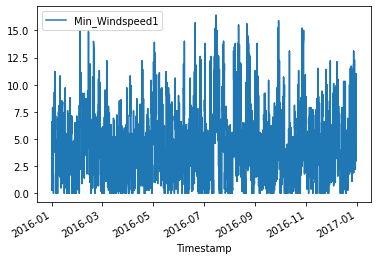

In [291]:
df.set_index('Timestamp',inplace=True)
df.index=pd.to_datetime(df.index)
#drop null values
df.dropna(inplace=True)
df.plot()

In [292]:
df

,Min_Windspeed1
Timestamp,
2016-01-01,3.7
2016-01-01,4.1
2016-01-01,4.5
2016-01-01,5.1
2016-01-01,4.7
...,...
2016-12-31,4.3
2016-12-31,4.2
2016-12-31,3.7


In [293]:
df = df.groupby('Timestamp')['Min_Windspeed1'].sum().reset_index(name ='Min_Windspeed1')


In [294]:
df

,Timestamp,Min_Windspeed1
0,2016-01-01,617.5
1,2016-01-02,401.1
2,2016-01-03,523.3
3,2016-01-04,953.0
4,2016-01-05,1032.5
...,...,...
361,2016-12-27,743.1
362,2016-12-28,1045.7
363,2016-12-29,927.2
364,2016-12-30,817.2


In [295]:
df.set_index('Timestamp',inplace=True)
df.index=pd.to_datetime(df.index)

In [296]:
# num_missing = (df_agg[['Max_Humidity']] == 0).sum()
# num_missing

In [297]:
df

,Min_Windspeed1
Timestamp,
2016-01-01,617.5
2016-01-02,401.1
2016-01-03,523.3
2016-01-04,953.0
2016-01-05,1032.5
...,...
2016-12-27,743.1
2016-12-28,1045.7
2016-12-29,927.2


##### 

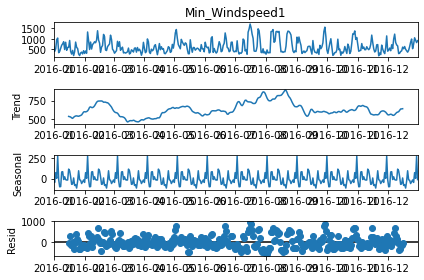

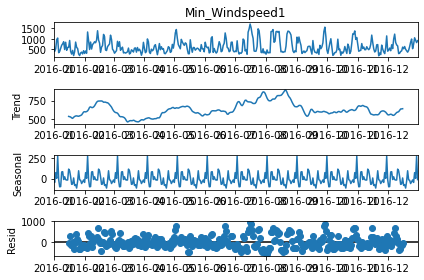

In [301]:
from statsmodels.tsa.seasonal import seasonal_decompose
seasonal_decompose(df['       '], model='additive', period=30).plot()

In [27]:
train, test = df.loc[df['Timestamp'] <= '2016-09-01 00:00:00+0000'], df.loc[df['Timestamp'] > '2016-09-01 00:00:00+0000']

In [28]:
train.tail()

,Timestamp,Min_Windspeed1,Max_Windspeed1,Avg_Windspeed1,Var_Windspeed1,Min_Windspeed2,Max_Windspeed2,Avg_Windspeed2,Var_Windspeed2,Min_Winddirection2,...,Anemometer2_CorrOffset,DistanceAirPress,AirRessureSensorZeroOffset,Anemometer1_Avg_Freq,Anemometer2_Avg_Freq,Pressure_Avg_Freq,Year,Month,Day,Hour
35126,2016-08-31 23:20:00+00:00,2.7,4.7,3.8,0.14,2.5,4.6,3.7,0.14,236,...,0,0,600,72,71,410,2016,8,31,23
35127,2016-08-31 23:30:00+00:00,2.8,4.8,3.7,0.06,2.8,4.7,3.7,0.06,236,...,0,0,600,71,71,410,2016,8,31,23
35128,2016-08-31 23:40:00+00:00,2.8,5.3,3.9,0.23,2.6,5.2,3.9,0.23,236,...,0,0,600,75,74,410,2016,8,31,23
35129,2016-08-31 23:50:00+00:00,3.0,5.0,4.1,0.11,3.1,5.0,4.1,0.10,236,...,0,0,600,78,78,410,2016,8,31,23
35130,2016-09-01 00:00:00+00:00,3.5,5.1,4.3,0.08,3.5,5.3,4.4,0.08,236,...,0,0,600,84,84,410,2016,9,1,0


In [29]:
test.head()

,Timestamp,Min_Windspeed1,Max_Windspeed1,Avg_Windspeed1,Var_Windspeed1,Min_Windspeed2,Max_Windspeed2,Avg_Windspeed2,Var_Windspeed2,Min_Winddirection2,...,Anemometer2_CorrOffset,DistanceAirPress,AirRessureSensorZeroOffset,Anemometer1_Avg_Freq,Anemometer2_Avg_Freq,Pressure_Avg_Freq,Year,Month,Day,Hour
35131,2016-09-01 00:10:00+00:00,3.9,6.1,4.8,0.20,3.9,6.2,4.8,0.20,236,...,0,0,600,92,93,410,2016,9,1,0
35132,2016-09-01 00:20:00+00:00,3.9,6.6,5.5,0.24,3.8,6.7,5.5,0.26,236,...,0,0,600,106,108,410,2016,9,1,0
35133,2016-09-01 00:30:00+00:00,3.2,5.6,4.7,0.23,3.4,5.7,4.7,0.23,236,...,0,0,600,91,92,410,2016,9,1,0
35134,2016-09-01 00:40:00+00:00,3.3,6.1,5.1,0.15,3.4,6.1,5.2,0.15,236,...,0,0,600,99,100,410,2016,9,1,0
35135,2016-09-01 00:50:00+00:00,4.8,7.1,5.8,0.19,4.8,7.3,5.9,0.20,236,...,0,0,600,114,115,410,2016,9,1,0


In [78]:
train.shape,test.shape

((35131, 45), (17566, 45))

In [79]:
scaler = StandardScaler()
scaler = scaler.fit(train[['Max_Humidity']])

train['Max_Humidity'] = scaler.transform(train[['Max_Humidity']])
test['Max_Humidity'] = scaler.transform(test[['Max_Humidity']])



<ipython-input-79-7e58deff9f0b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['Max_Humidity'] = scaler.transform(train[['Max_Humidity']])
<ipython-input-79-7e58deff9f0b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Max_Humidity'] = scaler.transform(test[['Max_Humidity']])


In [80]:
train

,Timestamp,Min_Windspeed1,Max_Windspeed1,Avg_Windspeed1,Var_Windspeed1,Min_Windspeed2,Max_Windspeed2,Avg_Windspeed2,Var_Windspeed2,Min_Winddirection2,...,Anemometer2_CorrOffset,DistanceAirPress,AirRessureSensorZeroOffset,Anemometer1_Avg_Freq,Anemometer2_Avg_Freq,Pressure_Avg_Freq,Year,Month,Day,Hour
0,2016-01-01 00:00:00+00:00,3.7,6.0,5.1,0.21,3.8,6.0,5.1,0.22,236,...,0,0,600,98,99,418,2016,1,1,0
1,2016-01-01 00:10:00+00:00,4.1,6.0,5.1,0.09,4.1,6.0,5.2,0.10,236,...,0,0,600,99,101,418,2016,1,1,0
2,2016-01-01 00:20:00+00:00,4.5,6.7,5.7,0.26,4.4,6.8,5.8,0.30,236,...,0,0,600,111,113,418,2016,1,1,0
3,2016-01-01 00:30:00+00:00,5.1,7.0,6.3,0.11,5.1,7.1,6.4,0.12,236,...,0,0,600,122,125,418,2016,1,1,0
4,2016-01-01 00:40:00+00:00,4.7,7.3,6.2,0.27,4.9,7.4,6.3,0.27,236,...,0,0,600,121,123,417,2016,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35126,2016-08-31 23:20:00+00:00,2.7,4.7,3.8,0.14,2.5,4.6,3.7,0.14,236,...,0,0,600,72,71,410,2016,8,31,23
35127,2016-08-31 23:30:00+00:00,2.8,4.8,3.7,0.06,2.8,4.7,3.7,0.06,236,...,0,0,600,71,71,410,2016,8,31,23
35128,2016-08-31 23:40:00+00:00,2.8,5.3,3.9,0.23,2.6,5.2,3.9,0.23,236,...,0,0,600,75,74,410,2016,8,31,23
35129,2016-08-31 23:50:00+00:00,3.0,5.0,4.1,0.11,3.1,5.0,4.1,0.10,236,...,0,0,600,78,78,410,2016,8,31,23


In [81]:
# TIME_STEPS=30

# def create_sequences(X, y, time_steps=TIME_STEPS):
#     Xs, ys = [], []
#     for i in range(len(X)-time_steps):
#         Xs.append(X.iloc[i:(i+time_steps)].values)
#         ys.append(y.iloc[i+time_steps])
    
#     return np.array(Xs), np.array(ys)

# X_train, y_train = create_sequences(train[['Max_Humidity']], train['Max_Humidity'])
# X_test, y_test = create_sequences(test[['Max_Humidity']], test['Max_Humidity'])

In [82]:
# print(f'Training shape: {X_train.shape}')

# print(f'Testing shape: {X_test.shape}')

Training shape: (35101, 30, 1)
Testing shape: (17536, 30, 1)


In [83]:

# model = Sequential()

# # model.add(keras.layers.LSTM(64,input_shape=inputshape))
# model.add(LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2])))
# model.add(Dropout(rate=0.2))
# model.add(RepeatVector(X_train.shape[1]))
# model.add(LSTM(128, return_sequences=True))
# model.add(Dropout(rate=0.2))
# model.add(TimeDistributed(Dense(X_train.shape[2])))
# model.compile(optimizer='adam', loss='mae')
# model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 128)               66560     
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 repeat_vector (RepeatVector  (None, 30, 128)          0         
 )                                                               
                                                                 
 lstm_1 (LSTM)               (None, 30, 128)           131584    
                                                                 
 dropout_1 (Dropout)         (None, 30, 128)           0         
                                                                 
 time_distributed (TimeDistr  (None, 30, 1)            129       
 ibuted)                                                

In [84]:
# history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1,
#                     callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, mode='min')], shuffle=False)

Epoch 1/100
988/988 [==============================] - 48s 46ms/step - loss: 0.3304 - val_loss: 0.3365
Epoch 2/100
988/988 [==============================] - 45s 45ms/step - loss: 0.3159 - val_loss: 0.3363
Epoch 3/100
988/988 [==============================] - 45s 46ms/step - loss: 0.3141 - val_loss: 0.3340
Epoch 4/100
988/988 [==============================] - 47s 48ms/step - loss: 0.3133 - val_loss: 0.3340
Epoch 5/100
988/988 [==============================] - 47s 47ms/step - loss: 0.3130 - val_loss: 0.3369
Epoch 6/100
988/988 [==============================] - 45s 46ms/step - loss: 0.3125 - val_loss: 0.3355


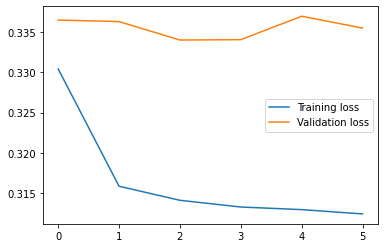

In [32]:
# import matplotlib.pyplot as plt

# plt.plot(history.history['loss'], label='Training loss')
# plt.plot(history.history['val_loss'], label='Validation loss')
# plt.legend();

In [33]:
# model.evaluate(X_test, y_test)

548/548 [==============================] - 11s 18ms/step - loss: 0.2647


0.2646782100200653

Reconstruction error threshold: 1.3206210389899893


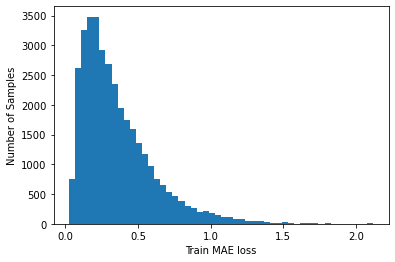

In [71]:
# X_train_pred = model.predict(X_train, verbose=0)
# train_mae_loss = np.mean(np.abs(X_train_pred - X_train), axis=1)

# plt.hist(train_mae_loss, bins=50)
# plt.xlabel('Train MAE loss')
# plt.ylabel('Number of Samples');
# threshold = np.max(train_mae_loss)-0.8
# # threshold = 1.75
# print(f'Reconstruction error threshold: {threshold}')

In [72]:
# train_mae_loss

array([[0.19192702],
       [0.19757521],
       [0.19828216],
       ...,
       [0.30466159],
       [0.38089185],
       [0.41085625]])

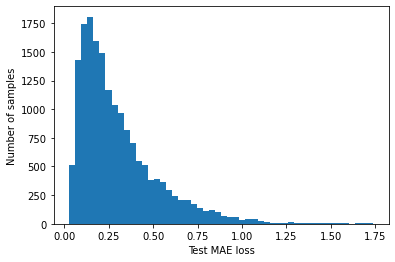

In [73]:
# X_test_pred = model.predict(X_test, verbose=0)
# test_mae_loss = np.mean(np.abs(X_test_pred-X_test), axis=1)

# plt.hist(test_mae_loss, bins=50)
# plt.xlabel('Test MAE loss')
# plt.ylabel('Number of samples');

In [74]:
# test_score_df = pd.DataFrame(test[TIME_STEPS:])
# test_score_df['loss'] = test_mae_loss
# test_score_df['threshold'] = threshold
# test_score_df['anomaly'] = test_score_df['loss'] > test_score_df['threshold']
# test_score_df['Max_Humidity'] = test[TIME_STEPS:]['Max_Humidity']

In [75]:
# test_mae_loss

array([[0.09788659],
       [0.091154  ],
       [0.08593028],
       ...,
       [0.10962954],
       [0.15581442],
       [0.20041138]])

In [76]:
# test_score_df.tail()

,Timestamp,Max_Humidity,loss,threshold,anomaly
52692,2016-12-31 23:10:00+00:00,0.001946,0.070422,1.320621,False
52693,2016-12-31 23:20:00+00:00,0.001946,0.108456,1.320621,False
52694,2016-12-31 23:30:00+00:00,-0.057809,0.109630,1.320621,False
52695,2016-12-31 23:40:00+00:00,-0.117564,0.155814,1.320621,False
52696,2016-12-31 23:50:00+00:00,-0.177319,0.200411,1.320621,False


In [77]:
# fig = go.Figure()
# fig.add_trace(go.Scatter(x=test_score_df['Timestamp'], y=test_score_df['loss'], name='Test loss'))
# fig.add_trace(go.Scatter(x=test_score_df['Timestamp'], y=test_score_df['threshold'], name='Threshold'))
# fig.update_layout(showlegend=True, title='Test loss vs. Threshold')
# fig.show()

In [78]:
# anomalies = test_score_df.loc[test_score_df['anomaly'] == True]
# anomalies.head()

,Timestamp,Max_Humidity,loss,threshold,anomaly
36333,2016-09-09 08:30:00+00:00,-0.954135,1.422532,1.320621,True
36334,2016-09-09 08:40:00+00:00,-1.013891,1.717855,1.320621,True
36335,2016-09-09 08:50:00+00:00,-0.774870,1.740164,1.320621,True
36336,2016-09-09 09:00:00+00:00,-0.774870,1.571200,1.320621,True
36337,2016-09-09 09:10:00+00:00,-1.073646,1.544243,1.320621,True


In [79]:
# anomalies.shape

(55, 5)

In [80]:
# test_score_df

,Timestamp,Max_Humidity,loss,threshold,anomaly
35161,2016-09-01 05:10:00+00:00,0.719007,0.097887,1.320621,False
35162,2016-09-01 05:20:00+00:00,0.719007,0.091154,1.320621,False
35163,2016-09-01 05:30:00+00:00,0.659252,0.085930,1.320621,False
35164,2016-09-01 05:40:00+00:00,0.659252,0.112032,1.320621,False
35165,2016-09-01 05:50:00+00:00,0.659252,0.107157,1.320621,False
...,...,...,...,...,...
52692,2016-12-31 23:10:00+00:00,0.001946,0.070422,1.320621,False
52693,2016-12-31 23:20:00+00:00,0.001946,0.108456,1.320621,False
52694,2016-12-31 23:30:00+00:00,-0.057809,0.109630,1.320621,False
52695,2016-12-31 23:40:00+00:00,-0.117564,0.155814,1.320621,False


In [81]:
# fig = go.Figure()
# fig.add_trace(go.Scatter(x=test_score_df['Timestamp'], y=scaler.inverse_transform(test_score_df['Max_Humidity']), name='Max_Humidity'))
# fig.add_trace(go.Scatter(x=anomalies['Timestamp'], y=scaler.inverse_transform(anomalies['Max_Humidity']), mode='markers', name='Anomaly'))
# fig.update_layout(showlegend=True, title='Detected anomalies')
# fig.show()